# Capstone Project - The Battle of the Neighborhoods (Week 2)
* Applied Data Science Capstone by IBM/Coursera 

## Introduction: Business Problem

### In this project we will try to study the influence of surrounding venues on houses in different locations of a city. This report is targeted to the Rental House Property Business stakeholders who are willing to purchase estates in Mumbai city, India.

### Very obvious statement can be made that bigger the house, larger the carpet area, higher is the rent price. Hence we will study houses with in terms of physical locations in the city. We will find those key elements that increase the property value in the area.

### We will try to detect locations which are a little bit within the center of the city, since the area of interest should not be secluded from the main parts of the city. Each area pointed out during the study for buying rental houses will have their own pros and cons expressed so that best possible final location can be chosen by stakeholders.

## Data

###  Based on definition of our problem, factors that will influence our decission are:
### 1] MagicBricks January 2020 Dataset : Available rental houses wihtin Mumbai city.
### 2] Google Maps API reverse geocoding : Distance from other rental houses available within that region.
### 3] Distance of selected region from the center of the city
### 4] Foursquare API : Venues surrounding the specific region will be provided.

### This data has been acquired from *MagicBricks* company  that provides a common platform for property buyers & sellers to locate properties of interest in India. The data is of January 2020 and is the latest data available on the platform.

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import requests
import shapely.geometry
import json
import pyproj
import math
import folium
import urllib
import pickle
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/Roastedalmonds/CourseraML_Project/master/MGBricks.csv')
df.head()

,Unnamed: 0,Unnamed: 0.1,area,bathroom_num,bedroom_num,developer,latitude,locality,longitude,rent,type
0,1,1,1000.0,1.0,1,House of Hiranandani,19.048395,Chembur,72.906829,35000,Apartment
1,2,2,1000.0,1.0,1,Cooperative Group Housing Society,0.000000,Andheri West,0.000000,33000,Apartment
2,3,3,1000.0,1.0,1,Godrej Properties,19.093749,Vikhroli,72.922604,44000,Apartment
3,4,4,1000.0,1.0,1,Godrej Properties,19.093749,Vikhroli,72.922604,40000,Apartment
4,5,5,1000.0,1.0,1,Sugee Group,19.016019,Dadar West,72.835136,57000,Apartment


## Now we will clean this dataset to our requirements.

In [3]:
df.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'area', 'bathroom_num', 'bedroom_num',
       'developer', 'latitude', 'locality', 'longitude', 'rent', 'type'],
      dtype='object')

In [4]:
df.shape

(419, 11)

In [5]:
df.drop(columns=['Unnamed: 0','Unnamed: 0.1'],inplace =True)

Trimming down the dataset to normal apartments and row houses.

In [6]:
df.drop(df[df['type']=='Penthouse'].index, inplace = True)
df.drop(df[df['type']=='Residential House'].index, inplace = True)

Now we rename our feature names for simplicity.

In here I will explain the features in this final dataset.
* area         - Area of the house in square feet.
* bathroom_num - Number of bathrooms.
* bedroom_num  - Number of bedrooms.
* developer    - Name of the developer who constructed the building. 
* latitude     - latitude coordinates.
* locality     - House vicinity.
* longitude    - longitude coordinates.
* rent         - Monthly Rent of the house.
* type         - House type i.e. apartment, condos,etc.


Quickly examine the resulting dataframe.

In [7]:
df.head()

,area,bathroom_num,bedroom_num,developer,latitude,locality,longitude,rent,type
0,1000.0,1.0,1,House of Hiranandani,19.048395,Chembur,72.906829,35000,Apartment
1,1000.0,1.0,1,Cooperative Group Housing Society,0.000000,Andheri West,0.000000,33000,Apartment
2,1000.0,1.0,1,Godrej Properties,19.093749,Vikhroli,72.922604,44000,Apartment
3,1000.0,1.0,1,Godrej Properties,19.093749,Vikhroli,72.922604,40000,Apartment
4,1000.0,1.0,1,Sugee Group,19.016019,Dadar West,72.835136,57000,Apartment


## Google Maps API

Let's first find the latitude & longitude of Mumbai city center, using specific, well known address and Google Maps geocoding API.

In [8]:
google_api_key = 'Changed'

In [9]:
import requests

def get_coordinates(api_key, address, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&address={}'.format(api_key, address)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        geographical_data = results[0]['geometry']['location'] # get geographical coordinates
        lat = geographical_data['lat']
        lon = geographical_data['lng']
        return [lat, lon]
    except:
        return [None, None]
    
address = 'Mumbai, Maharashtra, India'
mumbai_center = get_coordinates(google_api_key, address)
print('Coordinate of {}: {}'.format(address, mumbai_center))

Coordinate of Mumbai, Maharashtra, India: [19.0759837, 72.8776559]


### We will create functions which will return us conversion between Longitude Latitudes and Co-ordinate system. Then we will create an area grid field over Mumbai Map which will generate neighborhood candidates. Then we'll project those coordinates back to latitude/longitude degrees to be shown on a Folium map

In [10]:
def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')             
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]
                                                                                        
def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)


print('Coordinate transformation check')
print('-------------------------------')
print('Mumbai center longitude={}, latitude={}'.format(mumbai_center[1], mumbai_center[0]))
x, y = lonlat_to_xy(mumbai_center[1], mumbai_center[0])
print('Mumbai center UTM X={}, Y={}'.format(x, y))
lo, la = xy_to_lonlat(x, y)
print('Mumbai center longitude={}, latitude={}'.format(lo, la))

Coordinate transformation check
-------------------------------
Mumbai center longitude=72.8776559, latitude=19.0759837
Mumbai center UTM X=7519553.7675228, Y=3673050.823594147
Mumbai center longitude=72.87765590000004, latitude=19.075983699996904


We now define the grids with help of the cartesian coordinates.

In [11]:
mumbai_center_x, mumbai_center_y = lonlat_to_xy(mumbai_center[1], mumbai_center[0]) 
k = math.sqrt(3) / 2 
x_min = mumbai_center_x - 9500
x_step = 1100
y_min = mumbai_center_y -18000 - (int(150/k)*k*800 - 90000)/2
y_step = 1200 * k 

latitudes = []
longitudes = []
distances_from_center = []
xs = []
ys = []
for i in range(0, int(150/k)):
    y = y_min + i * y_step
    x_offset = 1800 if i%2==0 else 0
    for j in range(0, 150):
        x = x_min + j * x_step + x_offset
        distance_from_center = calc_xy_distance(mumbai_center_x, mumbai_center_y, x, y)
        if (distance_from_center <= 13501):
            lon, lat = xy_to_lonlat(x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_center.append(distance_from_center)
            xs.append(x)
            ys.append(y)

print(len(latitudes), 'candidate neighborhood centers generated.')

449 candidate neighborhood centers generated.


In [12]:
map_mumbai = folium.Map(location=mumbai_center, zoom_start=13)
folium.Marker(mumbai_center, popup='Kurla').add_to(map_mumbai)
for lat, lon in zip(latitudes, longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_mumbai) 
    
for lat, lon in zip(list(df['latitude']), list(df['longitude'])):
    folium.CircleMarker([lat,lon], radius=1,color='red',fill=True,fill_color='red',fill_opacity=1).add_to(map_mumbai)
    
map_mumbai

The blue points represent location candidate grid generated and the red points represents the location instances of MagicBricks dataset.

#### Now we use Google Maps API to get approximate addresses of those locations

In [13]:
def get_address(api_key, latitude, longitude, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&latlng={},{}'.format(api_key, latitude, longitude)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        address = results[0]['formatted_address']
        return address
    except:
        return None

addr = get_address(google_api_key, mumbai_center[0], mumbai_center[1])
print('Reverse geocoding check')
print('-----------------------')
print('Address of [{}, {}] is: {}'.format(mumbai_center[0], mumbai_center[1], addr))

Reverse geocoding check
-----------------------
Address of [19.0759837, 72.8776559] is: Kismat Nagar, Lower Parel, Friends Colony, Kurla West, Kurla, Mumbai, Maharashtra 400070, India


In [14]:
print('Obtaining location addresses: ', end='')
addresses = []
for lat, lon in zip(latitudes, longitudes):
    address = get_address(google_api_key, lat, lon)
    if address is None:
        address = 'NO ADDRESS'
    address = address.replace(', India', '') # We don't need country part of address
    addresses.append(address)
    print(' .', end='')
print(' done.')

Obtaining location addresses:  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . done.


We will store this information  inside aour dataframe df_locations and will use it further.
For now we will go through factors influencing rent rates.

In [15]:
df_locations = pd.DataFrame({'Address': addresses,
                             'Latitude': latitudes,
                             'Longitude': longitudes,
                             'X': xs,
                             'Y': ys,
                             'Distance from center': distances_from_center})

df_locations.head(1)

,Address,Latitude,Longitude,X,Y,Distance from center
0,"A-232, Twin Towers, Prabhadevi, Dadar West, Pr...",19.020207,72.828258,7.516654e+06,3.659867e+06,13498.768399


### Foursquare API

#### Acquire Venue category by filtering the json response for each instance.

In [16]:
listerx = list(df.longitude)
listery = list(df.latitude)
listx=[]
listy=[]

In [17]:
for (crow,vale) in zip(listerx,listery):
    x,y = lonlat_to_xy(crow,vale)
    listx.append(x)
    listy.append(y)
    print('.', end='')

...................................................................................................................................................................................................................................................................................................................................................................................................................................

In [18]:
df['x_coord']= pd.Series(listx)
df['y_coord']= pd.Series(listy)

#### We will use Foursquare API to acquire venues from the surrounding region.

In [19]:
client_id='changed'
client_secret = 'changed'


In [22]:
radius=500
limit=10
bajuka_sab=[]
nearbyVenues=[]
version = '20180724'
i=0
for y,x in zip(df.longitude,df.latitude):
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        client_id, client_secret, version, x, y, radius, limit)
    
    results = requests.get(url).json()     #['response']['groups'][0]['items'][0]['venue']['categories'][0]['name']
    i+=1
  
    if 'groups' in results['response']:
        try: 
            for x in results['response']['groups'][0]['items']:
                for z in x['venue']['categories']:
                    bajuka_sab.append(z['name'])
                  
            
            
        except:
            print('error')
    print(i)        
    nearbyVenues.append(bajuka_sab)
    print(nearbyVenues)
    bajuka_sab=[]

1
[['Lounge', 'Chinese Restaurant', 'Sandwich Place', 'Asian Restaurant', 'Movie Theater', 'Supermarket', 'Plaza', 'Indian Restaurant', 'Coffee Shop', 'Convenience Store']]
2
[['Lounge', 'Chinese Restaurant', 'Sandwich Place', 'Asian Restaurant', 'Movie Theater', 'Supermarket', 'Plaza', 'Indian Restaurant', 'Coffee Shop', 'Convenience Store'], []]
3
[['Lounge', 'Chinese Restaurant', 'Sandwich Place', 'Asian Restaurant', 'Movie Theater', 'Supermarket', 'Plaza', 'Indian Restaurant', 'Coffee Shop', 'Convenience Store'], [], ['Coffee Shop', 'Pub', 'Argentinian Restaurant', 'Cafeteria']]
4
[['Lounge', 'Chinese Restaurant', 'Sandwich Place', 'Asian Restaurant', 'Movie Theater', 'Supermarket', 'Plaza', 'Indian Restaurant', 'Coffee Shop', 'Convenience Store'], [], ['Coffee Shop', 'Pub', 'Argentinian Restaurant', 'Cafeteria'], ['Coffee Shop', 'Pub', 'Argentinian Restaurant', 'Cafeteria']]
5
[['Lounge', 'Chinese Restaurant', 'Sandwich Place', 'Asian Restaurant', 'Movie Theater', 'Supermarket', '

We save this list inside a file so that we wouldn't need to make the API calls again.

In [20]:
with open("C:\\Users\\Family kadam\\Desktop\\MainVenues.json", "r") as f1:
    nearbyVenues = json.load(f1)

In [21]:
df.dropna(inplace = True)

#### We will to determine the popular neaby venues in the surrounding, localities with high number demand of for rent houses. We will clear the clutter of regions with average perks.

In [22]:
# Getting most popular venues by counting it's frequency
word_list=[]           
for x in nearbyVenues:
    words_to_count = (word for word in x if word[:1].isupper())
    c = Counter(words_to_count)
    res = [[ i for i, j in c.most_common(5) ], 
          [ j for i, j in c.most_common(5) ]] 
    word_list.append(res[0])
    res.clear()

df['nearby_venues']= pd.Series(word_list)

freq={}
for x in df['nearby_venues']:
    for venue in x:
        if (venue in freq): 
            freq[venue] += 1
        else: 
            freq[venue] = 1
            
# Getting most popular locality by counting it's frequency

freq_loc={}
for x in df['locality']:
    if (x in freq_loc): 
        freq_loc[x] += 1
    else: 
        freq_loc[x] = 1
        
most_loc = sorted(freq_loc, key=freq_loc.get, reverse=True)[:25]   
most_popVenue = sorted(freq, key=freq.get, reverse=True)[:15]
unpopular =sorted(freq, key=freq.get)[:128]

# Appending public transport stations as an important venue
most_popVenue.append('Bus Station')
most_popVenue.append('Train Station')

In [23]:
print(freq)

{'Lounge': 60, 'Chinese Restaurant': 89, 'Sandwich Place': 17, 'Asian Restaurant': 19, 'Movie Theater': 8, 'Coffee Shop': 67, 'Pub': 50, 'Argentinian Restaurant': 4, 'Cafeteria': 4, 'Seafood Restaurant': 22, 'Indian Restaurant': 161, 'Fast Food Restaurant': 65, 'Pizza Place': 46, 'Multiplex': 29, 'Gym / Fitness Center': 32, 'Gym': 46, 'Bakery': 52, 'Bank': 1, 'Burger Joint': 8, 'Ice Cream Shop': 65, 'Café': 93, 'Bus Station': 16, 'Snack Place': 19, 'Smoke Shop': 15, 'Scenic Lookout': 14, 'Mountain': 2, 'Bar': 28, 'Tea Room': 9, 'Soccer Field': 4, 'Whisky Bar': 6, 'Hotel': 39, 'Convenience Store': 31, 'Grocery Store': 14, 'Vegetarian / Vegan Restaurant': 21, 'Arts & Crafts Store': 1, 'Restaurant': 37, 'Historic Site': 1, 'Brewery': 20, 'BBQ Joint': 13, 'Shopping Mall': 21, 'Department Store': 27, 'Neighborhood': 2, 'Sports Bar': 6, 'Pet Store': 2, 'Train Station': 11, 'Clothing Store': 17, 'Pool Hall': 3, 'Bookstore': 5, 'Dessert Shop': 29, 'Garden': 7, 'Health & Beauty Service': 1, 'In

Here we have our top 10 occuring venue categories for our MagicBricks data set houses.

In [24]:
print(f'Top 10 occuring venue categories: ',most_popVenue[0:10])

Top 10 occuring venue categories:  ['Indian Restaurant', 'Café', 'Chinese Restaurant', 'Coffee Shop', 'Fast Food Restaurant', 'Ice Cream Shop', 'Lounge', 'Bakery', 'Pub', 'Pizza Place']


Lets plot the frequency of the some topmost popular venue categories.

<BarContainer object of 11 artists>

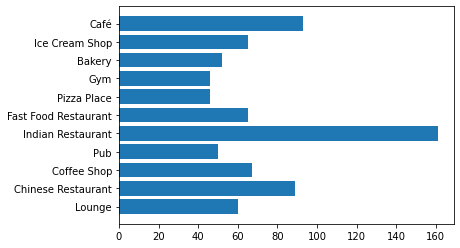

In [25]:
tmp=pd.DataFrame.from_dict(freq, orient='index')
tmp['index']=tmp.index
tmp.rename(columns={0:'hey'},inplace=True)
tmp.drop(tmp[tmp['hey']<45].index,inplace=True)
plt.barh(tmp['index'],tmp['hey'])

#### Since we now have our popular venue surrounding data, we will apply it to our previously generated neighborhood candidates.
####  Let us now filter those locations we're interested in with a range 300 meters within the neighborhood candidate with the help of Foursquare API.

In [42]:
radius=300
limit=8
bajuka_sab=[]
venues=[]
version = '20180724'
i=0
for y,x in zip(df_locations.Longitude,df_locations.Latitude):
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        client_id, client_secret, version, x, y, radius, limit)
    
    results = requests.get(url).json()   #['response']['groups'][0]['items'][0]['venue']['categories'][0]['name']
    i+=1
    
    if 'groups' in results['response']:
        try: 
            for x in results['response']['groups'][0]['items']:
                for z in x['venue']['categories']:
                    bajuka_sab.append(z['name'])
        except:
            print('error')
    print(i)        
    venues.append(bajuka_sab)
    print(venues)
    #print('.', end='')
    bajuka_sab=[]

1
[['Beach', 'Beach']]
2
[['Beach', 'Beach'], ['Seafood Restaurant', 'Chinese Restaurant', 'Coffee Shop', 'Convenience Store']]
3
[['Beach', 'Beach'], ['Seafood Restaurant', 'Chinese Restaurant', 'Coffee Shop', 'Convenience Store'], ['Indian Restaurant', 'Shopping Mall', 'Flower Shop']]
4
[['Beach', 'Beach'], ['Seafood Restaurant', 'Chinese Restaurant', 'Coffee Shop', 'Convenience Store'], ['Indian Restaurant', 'Shopping Mall', 'Flower Shop'], ['Indian Restaurant', 'Movie Theater', 'Breakfast Spot', 'Cricket Ground']]
5
[['Beach', 'Beach'], ['Seafood Restaurant', 'Chinese Restaurant', 'Coffee Shop', 'Convenience Store'], ['Indian Restaurant', 'Shopping Mall', 'Flower Shop'], ['Indian Restaurant', 'Movie Theater', 'Breakfast Spot', 'Cricket Ground'], ['Gym', 'Rest Area', 'Fast Food Restaurant']]
6
[['Beach', 'Beach'], ['Seafood Restaurant', 'Chinese Restaurant', 'Coffee Shop', 'Convenience Store'], ['Indian Restaurant', 'Shopping Mall', 'Flower Shop'], ['Indian Restaurant', 'Movie Theat

Again for grid locations we save the venue categories explored inside a file.

In [26]:
with open("C:\\Users\\Family kadam\\Desktop\\MainVenuesGrid.json", "r") as f3:
    venues = json.load(f3)

#### Now we will make use of these neighborhood candidates  to match them with our popular venues we studied from MagicBricks data set. Filter and add to our dataframe  their counts which will be shortlisted again to acquire places which are more compatible as residential area.

In [27]:
df_locations['nearBy']=pd.Series(venues)

In [28]:
indx=0
dit={}
ditr=[]
count=0
flag=0
for x in df_locations['nearBy']:
    for y in most_popVenue:
        if y in x:
            flag = 1
            count+=1
            
    dit[indx]=count
    ditr.append(count)
    indx+=1
    count=0
    flag=0
#Adding venu count as a new feature
df_locations['CountVen']=pd.Series(ditr)
df_locations.drop(df_locations[df_locations['CountVen']<2].index, inplace = True)
df_locations.CountVen.astype('int64')
df_locations.dropna(inplace=True)

#### Lets take a look at our filtered locations in form of a heatmap. 

In [29]:
good_latitudes = df_locations['Latitude'].values
good_longitudes = df_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

In [30]:
from folium.plugins import HeatMap

map_mumbai = folium.Map(location=mumbai_center, zoom_start=13)
HeatMap(good_locations, radius=25).add_to(map_mumbai)
folium.Marker(mumbai_center).add_to(map_mumbai)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_mumbai)
map_mumbai

#### Clustering of locations to create centers of zones containing for the areas of interest.
We will use clustering algorithm to create zones for places high potential for Renting House Business. If you check the map properly we get the points to be an exact location for an address. The heatmap feature is an inadequate to get an extent of area fanned out area. It's size also changes with respect to the amount of zoom scale. Since the locations we pinned to the folium map are specific to that street localtiy, we need to get a cover of an overall area which is suitable for us. Since the locations are clustered on basis of thier co-ordinates, we broaden out our results accordingly. The cluster centroids will be our approximate zones of interest.
#### These zones & their centers and addresses will be the final result of our analysis.

In [31]:
number_of_clusters = 15

good_xys = df_locations[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)
cluster_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in kmeans.cluster_centers_]


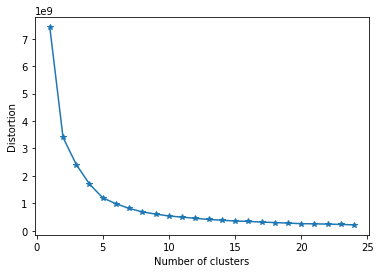

In [32]:
distortions = []
for i in range(1, 25):
    kmeans = KMeans(
        n_clusters=i,
        tol=1e-04, random_state=0
    )
    kmeans.fit(good_xys)
    distortions.append(kmeans.inertia_)

# plot
plt.plot(range(1, 25), distortions, marker='*')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

15 seems to be a proper number of clusters for our model.

In [33]:

map_mumbai = folium.Map(location=mumbai_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_mumbai)
HeatMap(good_locations).add_to(map_mumbai)
folium.Circle(mumbai_center, radius=8000, color='white', fill=True, fill_opacity=0.3).add_to(map_mumbai)
folium.Marker(mumbai_center).add_to(map_mumbai)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=True, fill_opacity=0.2).add_to(map_mumbai) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=1, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_mumbai)
map_mumbai

### Our clusters represent groupings of most of the candidate locations and cluster centers are placed nicely in the middle of the zones 'rich' with location candidates.

### Reverse geocode those candidate area centers to get the addresses which can be presented to stakeholders.

In [34]:
candidate_area_addresses = []
print('')
print('Addresses of centers of areas recommended for further analysis:')
print('\n')
i=1
for lon, lat in cluster_centers:
    addr = get_address(google_api_key, lat, lon).replace(', India', '')
    candidate_area_addresses.append(addr)    
    x, y = lonlat_to_xy(lon, lat)
    d = calc_xy_distance(x, y, mumbai_center_x, mumbai_center_y)
    print('{}) {}{} => {:.1f}km from Kurla, Mumbai'.format(i,addr, ' '*(50-len(addr)), d/1000))
    i+=1
    print('\n')



Addresses of centers of areas recommended for further analysis:


1) plot no55, 1st FL,flat no.7.Neelam Bldg, 1st lane, Dadar East, Hindu Colony, Dadar, Mumbai, Maharashtra 400014 => 11.9km from Kurla, Mumbai


2) 308/A, AAPLI EKTA SOCIETY, Navpada, Marol, Andheri East, Mumbai, Maharashtra 400059 => 5.9km from Kurla, Mumbai


3) 1582, Rd Number 4, TPS III, Sen Nagar, Santacruz East, Mumbai, Maharashtra 400055 => 6.4km from Kurla, Mumbai


4) 101-240, Babli Mahadev Kanekar Marg, Saibaba Nagar, Pant Nagar, Ghatkopar East, Mumbai, Maharashtra 400077 => 5.8km from Kurla, Mumbai


5) 2-3, KN Gaikwad Marg, Ganesh Nagar, Postal Colony, Chembur, Mumbai, Maharashtra 400071 => 4.8km from Kurla, Mumbai


6) kritika car transport mumbai;, Powai Kailash Complex Link Rd, 400076, Sainath Nagar, Powai, Mumbai, Maharashtra 400076 => 10.4km from Kurla, Mumbai


7) G-17/18, Jasmine Mill Rd, Shahu Nagar, Mahim East, Dharavi, Mumbai, Maharashtra 400017 => 8.6km from Kurla, Mumbai


8) C/209, Raheja Vihar 

## RESULT

Through our analysis we see that the houses rent prices in Mumbai City are influenced by various features, we  checked out from analysis of original data set of rent houses provided by MagicBricks. We create a grid of loaction candidates with a radius of apporximately 9 km in range. Then from the conversion into Cartesian coordinates of locations we gained distance of each coordinate from the center of the city. The distance of the region from the center played a huge role since we recognize which filtered candidate is secluded from the city and isn't a reliable output.

In the MagicBricks data set, we checked out the venues of the neighbor candidates within the range of *500 meters* and *limit 10*. From these output we then made a list of most popular venues and unpopular venues. The *popular venues list* comprised of Indian restaurants, Cafe, Ice Cream restaurants and most suprisingly Chinese retaurants as well. Along with these categories, since we know that an area close to the *public commute* is necessary well, we append *Train Stations and Bus Stations* categories in the popular lists. We again use Fourquare API to gather venue categories near the self generated neighbor candidates withinin the eange of 300 meters and match with the popular venue list. We keep instances within higher frequency of venues that match. 

By these filteration we are left with areound *63 possible candidate locations*. We then make clusters of these locations to give us a precise area of interest. The output is a list of locations with hidden potential of high demand for houses on rent.

## Conclusion

The goal of this project was to acquire list of possible location in Mumbai city for stake holders of house rentals business. These locations were choosed on basis of factors which applied to a reliable data set of rental houses i.e. MagicBricks. With the help of Google Maps API we were able to perform operations on location of interest. We explored and collected data of a venue and used it's category with the help of Foursquare API to shortlist the number instances generated by Google Maps API. This shortlisted instances were hence cultivated from features of MagicBricks data set.
The number of suitable clusters were evaluated from Distortion Graph. These clusters pointed out in this study are created as major potential locations and are recommended for Rental Houses stakeholders.These locations then need to be further processed by the stakeholders themselves based on the charactersitics of the candidates locations as per their own needs.